# Importar librerias

In [151]:
import pandas as pd
import numpy as np
from quickda.explore_data import *
from quickda.explore_numeric import *
from quickda.explore_categoric import *
from quickda.explore_numeric_categoric import *
import matplotlib.pyplot as plt
import pandas as pd
from pandas_profiling import ProfileReport
import seaborn as sns

%matplotlib inline

# Leer la información y los nombres de las columnas

In [123]:
data = pd.read_csv("breast-cancer-wisconsin.data", header=None)

with open("breast-cancer-wisconsin.names") as file:
    columnNames = [line.rstrip().split("  ")[0] for line in file]

data.columns = columnNames

# Verificar si hay datos nulos

In [124]:
print("Hay datos nulos?", data.isnull().values.any())

Hay datos nulos? False


## 1.1 Haga una exploración rápida de sus datos para eso haga un resumen de su dataset.

In [125]:
data.head()

,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2


In [126]:
explore(data, method="summarize")

c:\Users\rober\AppData\Local\Programs\Python\Python310\lib\site-packages\quickda\explore_data.py:27: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

c:\Users\rober\AppData\Local\Programs\Python\Python310\lib\site-packages\quickda\explore_data.py:28: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

c:\Users\rober\AppData\Local\Programs\Python\Python310\lib\site-packages\quickda\explore_data.py:29: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
Bare Nuclei,object,699,0,0.0,11,1,-,-,-,?,-,-,-,-
Bland Chromatin,int64,699,0,0.0,10,1,2.0,3.0,5.0,10,3.437768,3.0,2.438364,1.099969
Class,int64,699,0,0.0,2,2,2.0,2.0,4.0,4,2.689557,2.0,0.951273,0.654564
Clump Thickness,int64,699,0,0.0,10,1,2.0,4.0,6.0,10,4.41774,4.0,2.815741,0.592859
Marginal Adhesion,int64,699,0,0.0,10,1,1.0,1.0,4.0,10,2.806867,1.0,2.855379,1.524468
Mitoses,int64,699,0,0.0,9,1,1.0,1.0,1.0,10,1.589413,1.0,1.715078,3.560658
Normal Nucleoli,int64,699,0,0.0,10,1,1.0,1.0,4.0,10,2.866953,1.0,3.053634,1.422261
Sample code number,int64,699,0,0.0,645,61634,870688.5,1171710.0,1238298.0,13454352,1071704.098712,1171710.0,617095.729819,13.675326
Single Epithelial Cell Size,int64,699,0,0.0,10,1,2.0,2.0,4.0,10,3.216023,2.0,2.2143,1.712172
Uniformity of Cell Shape,int64,699,0,0.0,10,1,1.0,1.0,5.0,10,3.207439,1.0,2.971913,1.161859


In [127]:
data.describe()

,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bland Chromatin,Normal Nucleoli,Mitoses,Class
count,6.990000e+02,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000
mean,1.071704e+06,4.417740,3.134478,3.207439,2.806867,3.216023,3.437768,2.866953,1.589413,2.689557
std,6.170957e+05,2.815741,3.051459,2.971913,2.855379,2.214300,2.438364,3.053634,1.715078,0.951273
min,6.163400e+04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000
25%,8.706885e+05,2.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,2.000000
50%,1.171710e+06,4.000000,1.000000,1.000000,1.000000,2.000000,3.000000,1.000000,1.000000,2.000000
75%,1.238298e+06,6.000000,5.000000,5.000000,4.000000,4.000000,5.000000,4.000000,1.000000,4.000000
max,1.345435e+07,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,4.000000


In [128]:
from pandas_profiling import ProfileReport
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 1.2. Diga el tipo de cada una de las variables del dataset (cualitativa o categórica, cuantitativa continua, cuantitativa discreta)

Como se puede observar en el resumen anterior, existen 11 variables en el dataset. 9 de estas son numericas y 2 son categoricas.

Categoricas:
  - Class
  - Sample code number

Cuantitativas:
  - Clumb Thickness (discreta)
  - Uniformity of cell Size (discreta)
  - Uniformity of Cell Shape (discreta)
  - Marginal Adhesion (discreta)
  - Single Epithelial Cell Size (discreta)
  - Single Epithelial Cell Size (discreta)
  - Bland Chromatin (discreta)
  - Normal Nucleoli (discreta) 
  - Mitoses (discreta)

## 1.3. Incluya los gráficos exploratorios siendo consecuentes con el tipo de variable queestán representando.

Outlier Analysis - Boxplot


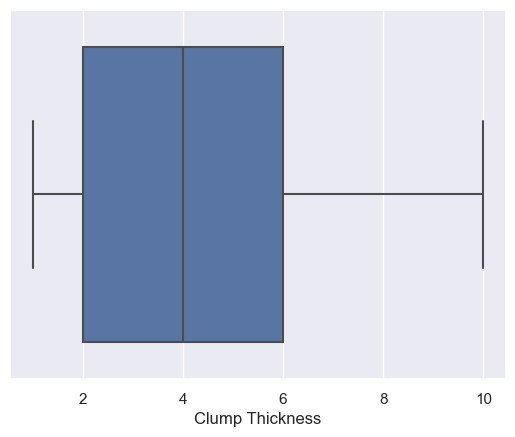

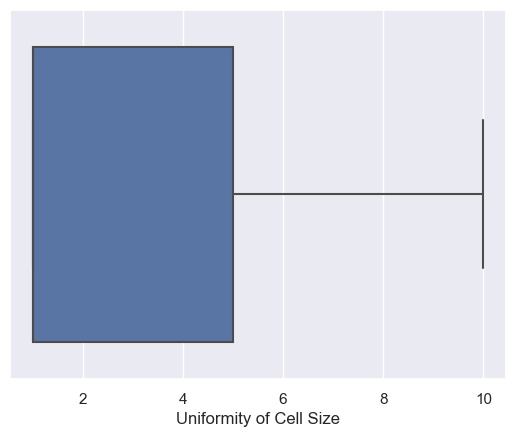

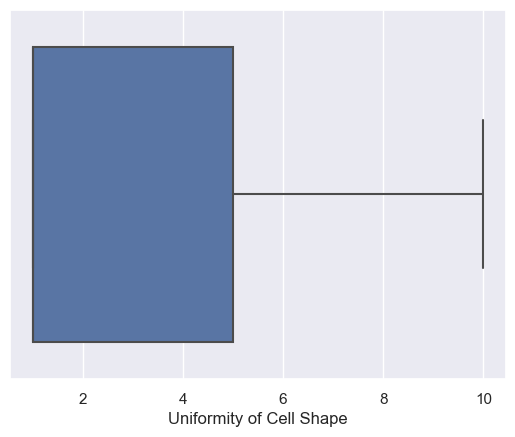

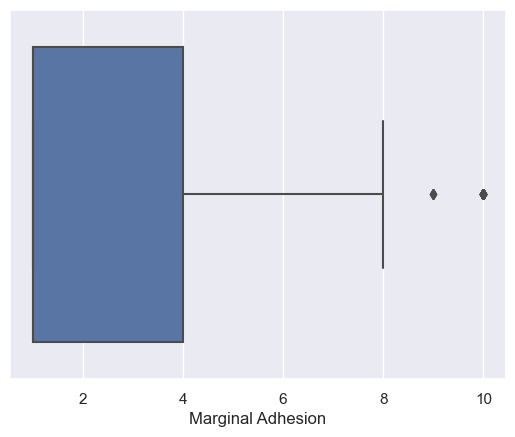

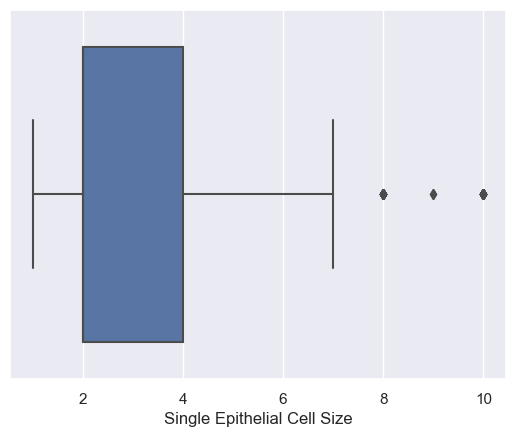

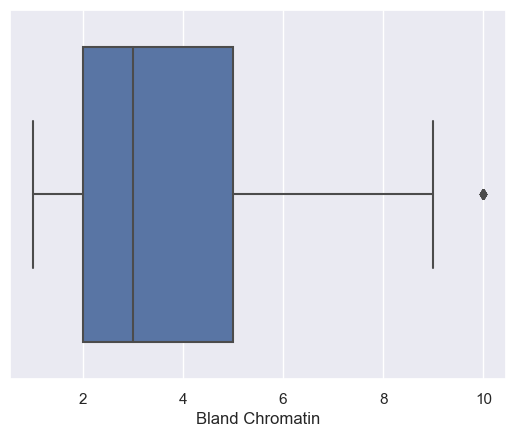

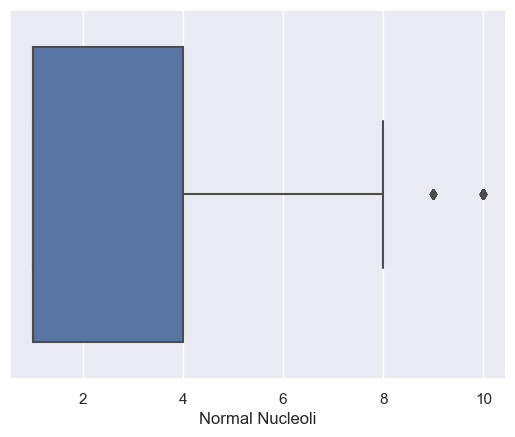

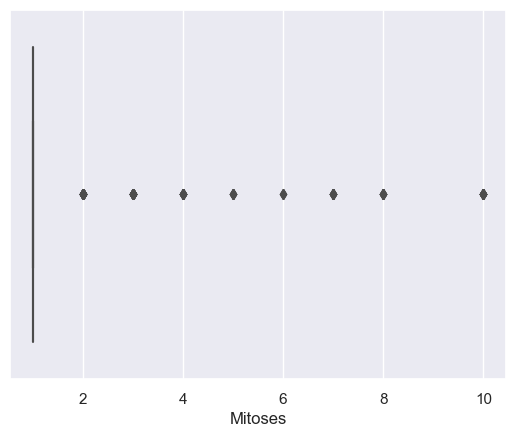

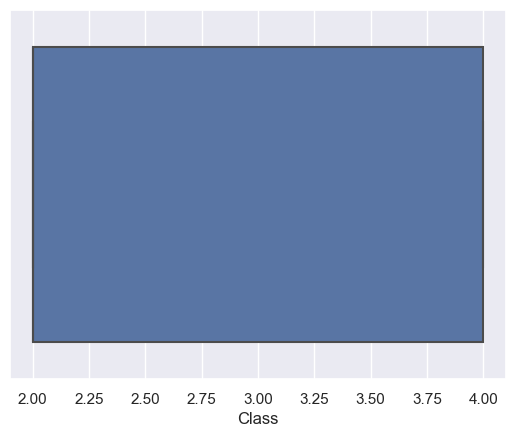

Distribution Analysis - Histogram


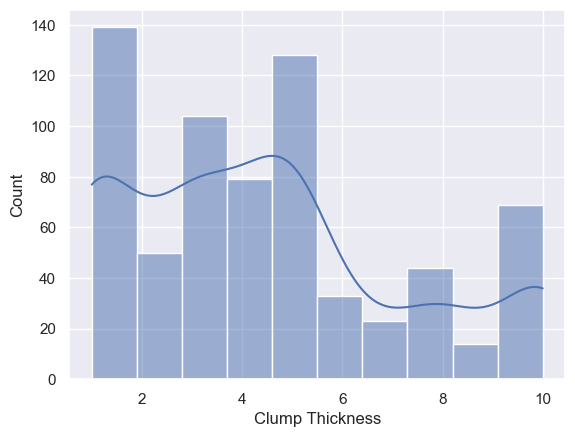

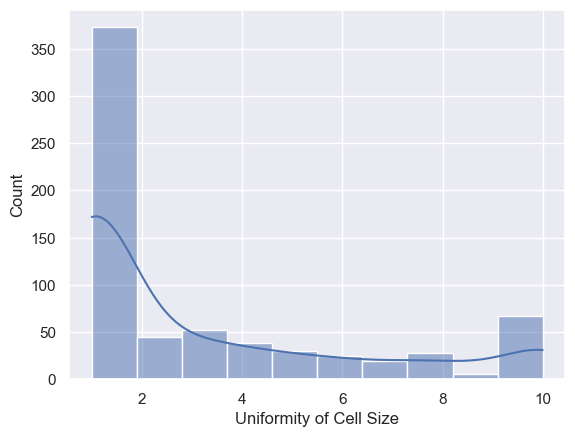

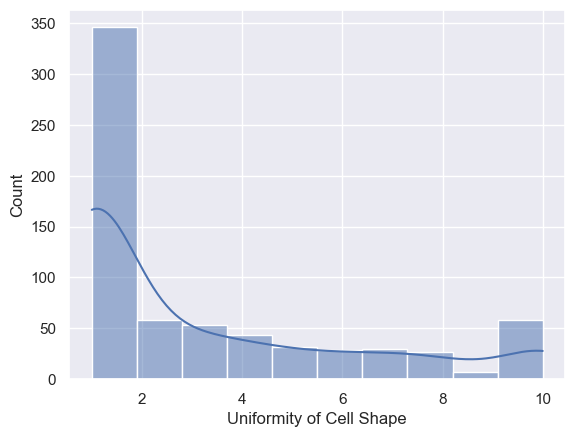

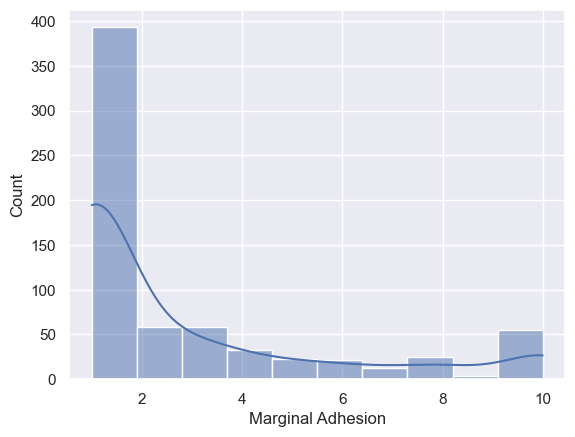

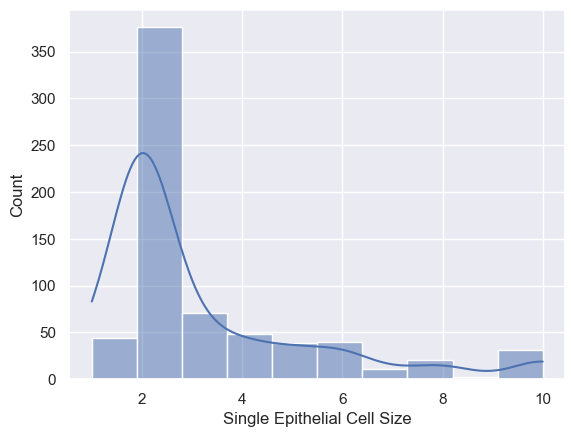

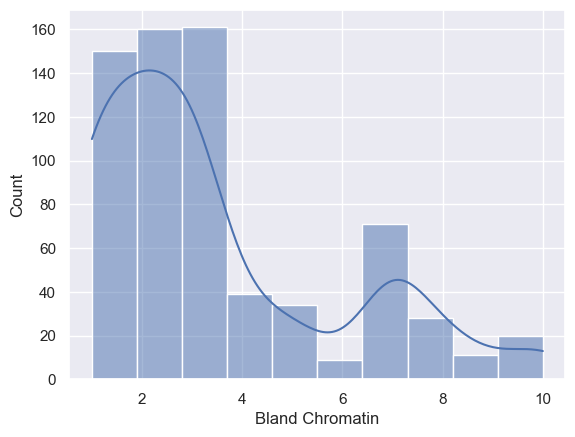

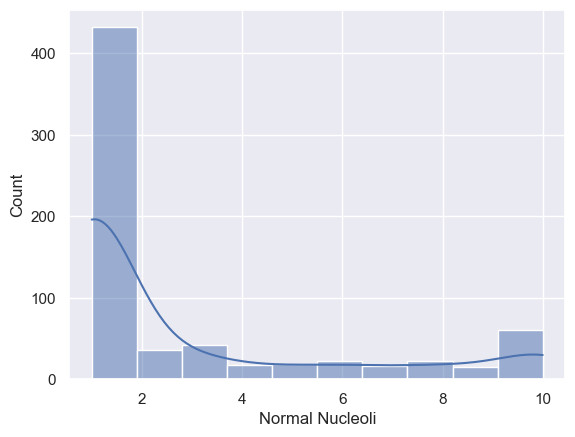

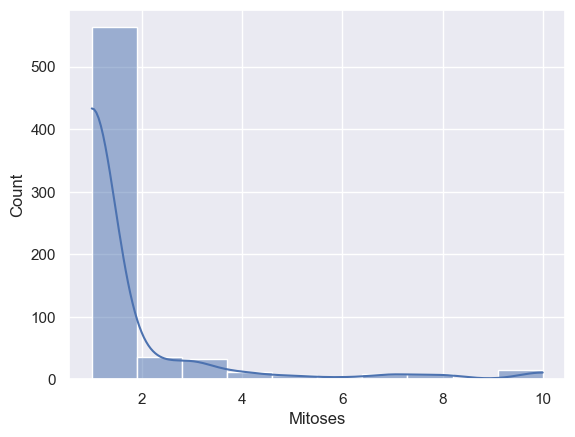

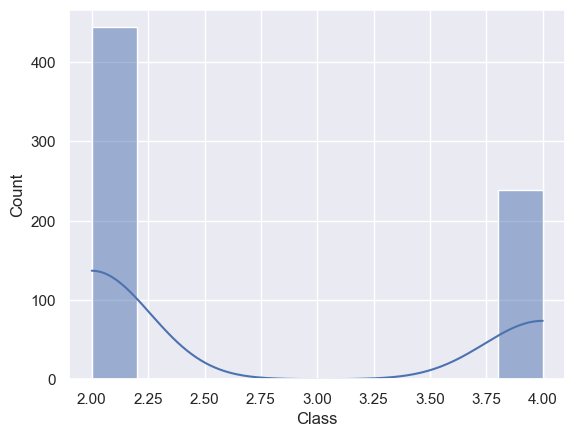

In [152]:
eda_num(data)

## 1.4. Aísle las variables numéricas de las categóricas, haga un análisis de correlación entre las mismas.

En el cazo de la correlación, el profiler nos da un análisis de correlación completo. Esto se realizó junto con la exploración de datos.

## 1.5. Utilice las variables categóricas, haga tablas de frecuencia, proporción, gráficas de barras o cualquier otra técnica que le permita explorar los datos

<BarContainer object of 2 artists>

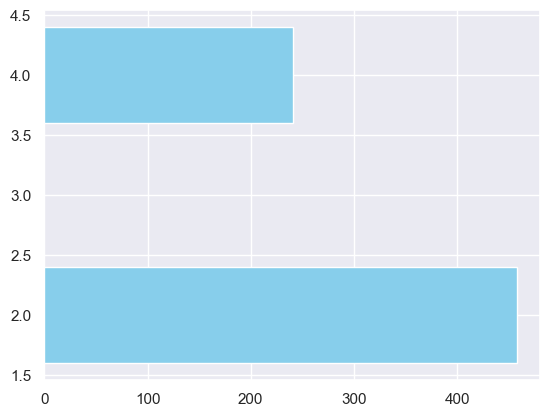

In [129]:
classCount = data['Class'].value_counts()
classes = list(classCount.keys())
counts = list(classCount.values)
 
# creating the bar plot
plt.barh(classes, counts, color ='skyblue')

In [130]:
print('El valor maximo de "sanple code number" es:', data['Sample code number'].max())
print('El valor minimo de "sanple code number" es:', data['Sample code number'].min())

El valor maximo de "sanple code number" es: 13454352
El valor minimo de "sanple code number" es: 61634


## 1.6. Realice la limpieza de variables utilizando las técnicas vistas en clase, u otras que piense pueden ser de utilidad

In [131]:
data = data.drop([
  'Sample code number'
],axis=1)
data.drop(data[data['Bare Nuclei'] == "?"].index, inplace = True)
data

,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
0,5,1,1,1,2,1,3,1,1,2
1,5,4,4,5,7,10,3,2,1,2
2,3,1,1,1,2,2,3,1,1,2
3,6,8,8,1,3,4,3,7,1,2
4,4,1,1,3,2,1,3,1,1,2
...,...,...,...,...,...,...,...,...,...,...
694,3,1,1,1,3,2,1,1,1,2
695,2,1,1,1,2,1,1,1,1,2
696,5,10,10,3,7,3,8,10,2,4
697,4,8,6,4,3,4,10,6,1,4


## 2.1. Pruebe los modelos de Regresión Logística y el de K-NN

In [132]:
from sklearn.model_selection import train_test_split
x = data.iloc[:, :-1].values
y = data.iloc[:, -1].values
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(x, y, test_size = 0.25, random_state = 0)

In [133]:
print(X_entreno)

[[7 6 10 ... 9 10 2]
 [8 3 8 ... 8 9 8]
 [8 10 10 ... 10 10 1]
 ...
 [1 1 1 ... 1 1 1]
 [3 1 1 ... 2 1 1]
 [10 9 7 ... 7 7 1]]


In [134]:
from sklearn.preprocessing import StandardScaler
normalizador = StandardScaler()
X_entreno = normalizador.fit_transform(X_entreno)
X_prueba = normalizador.transform(X_prueba)


In [135]:
print(X_entreno)

[[ 0.91903747  0.9407658   2.30881719 ...  2.22576767  2.27129602
   0.24623928]
 [ 1.27578287 -0.04290763  1.63138773 ...  1.82407819  1.94996317
   3.74830911]
 [ 1.27578287  2.25233038  2.30881719 ...  2.62745714  2.27129602
  -0.33743902]
 ...
 [-1.22143494 -0.69868992 -0.73961536 ... -0.98774815 -0.62069958
  -0.33743902]
 [-0.50794414 -0.69868992 -0.73961536 ... -0.58605867 -0.62069958
  -0.33743902]
 [ 1.98927367  1.92443923  1.29267301 ...  1.42238871  1.30729749
  -0.33743902]]


In [136]:
from sklearn.linear_model import LogisticRegression
clasificador = LogisticRegression(random_state = 0)
clasificador.fit(X_entreno, y_entreno)

LogisticRegression(random_state=0)

In [137]:
print(clasificador.predict(normalizador.transform([[1,1,1,1,1,1,1,1,1]])))

[2]


In [138]:
y_pred = clasificador.predict(X_prueba)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_prueba.reshape(len(y_prueba),1)),1))

[[2 2]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [4 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 2]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [2 4]
 [4 2]
 [4 4]
 [4 4]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [2 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 2]

In [139]:
from sklearn.metrics import confusion_matrix, accuracy_score
matconf = confusion_matrix(y_prueba, y_pred)
print(matconf)
accuracy_score(y_prueba, y_pred)

[[103   4]
 [  5  59]]


0.9473684210526315

In [140]:
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(x, y, test_size = 0.25, random_state = 0)
from sklearn.preprocessing import StandardScaler
normalizador = StandardScaler()
X_entreno = normalizador.fit_transform(X_entreno)
X_prueba = normalizador.transform(X_prueba)

In [141]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 1)
knn.fit(X_entreno, y_entreno)

KNeighborsClassifier(n_neighbors=1)

In [142]:
pred = knn.predict(X_prueba)

In [143]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_prueba, pred))
print(classification_report(y_prueba, pred))

[[104   3]
 [  7  57]]
              precision    recall  f1-score   support

           2       0.94      0.97      0.95       107
           4       0.95      0.89      0.92        64

    accuracy                           0.94       171
   macro avg       0.94      0.93      0.94       171
weighted avg       0.94      0.94      0.94       171



In [144]:
tasa_error = []

# Puede tardar un poco
for i in range(1, 40):
    
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(X_entreno, y_entreno)
    pred_i = knn.predict(X_prueba)
    tasa_error.append(np.mean(pred_i != y_prueba))

Text(0, 0.5, 'Tasa de Error')

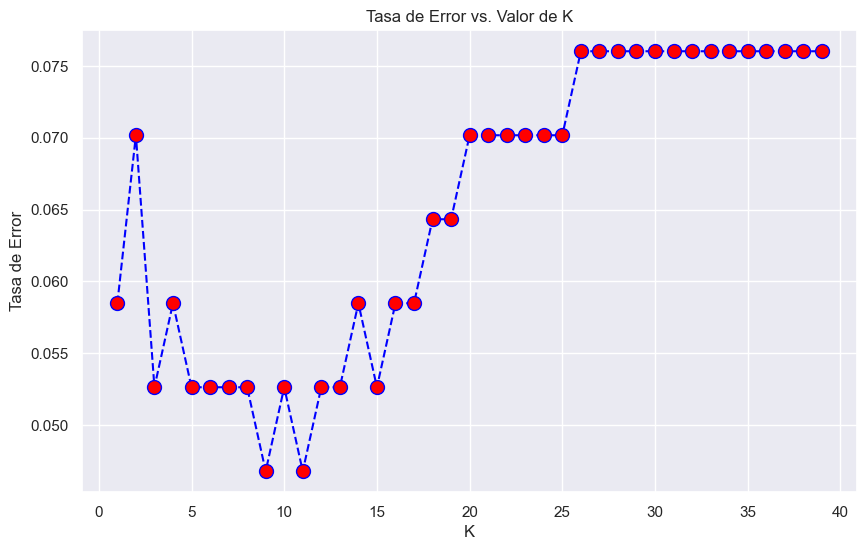

In [145]:
plt.figure(figsize = (10, 6))
plt.plot(range(1, 40), tasa_error, color = 'blue', linestyle = 'dashed', marker = 'o',
         markerfacecolor = 'red', markersize = 10)
plt.title('Tasa de Error vs. Valor de K')
plt.xlabel('K')
plt.ylabel('Tasa de Error')

In [149]:
# AHORA CON K = 5
knn = KNeighborsClassifier(n_neighbors = 9)

knn.fit(X_entreno, y_entreno)
pred = knn.predict(X_prueba)

print('CON K = 5')
print()
print('Matriz de Confusión\n')
print(confusion_matrix(y_prueba,pred))
print('\n')
print(classification_report(y_prueba,pred))

CON K = 5

Matriz de Confusión

[[103   4]
 [  4  60]]


              precision    recall  f1-score   support

           2       0.96      0.96      0.96       107
           4       0.94      0.94      0.94        64

    accuracy                           0.95       171
   macro avg       0.95      0.95      0.95       171
weighted avg       0.95      0.95      0.95       171



## 2.2. ¿Cuál es el modelo con mejor rendimiento? Utilice las métricas vistas en clase para dar respaldo a su respuesta